**Swin UNETR, FedAvg, ISLES'24**

**Imports & Drive Mount**

In [14]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [15]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import (
    Compose, LoadImaged, EnsureChannelFirstd, Orientationd,
    Spacingd, CropForegroundd, ResizeWithPadOrCropd, NormalizeIntensityd
)

from monai.networks.nets import SwinUNETR
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [16]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [17]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES24 Split Preprocessed"
print(data_dir)

D:/F25-156/ISLES24 Split Preprocessed


In [18]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints"
log_dir = "D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs"

Checkpoints will be saved to: D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs


In [19]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [20]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [21]:
# # Target shape for all volumes
# target_shape = (128,128,128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),
    
#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")  # image vs label interpolation
#     ),
    
#     # Crop both using image as reference
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image"
#     ),
    
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape,
#         mode=("constant", "constant")  # safe for labels
#     ),
    
#     NormalizeIntensityd(
#         keys=["image"],
#         nonzero=True
#     )
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [22]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [23]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Original samples: 50 | Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 40 | Image shape: (512, 512, 83) | Mask shape: (512, 512, 83) | Mask values: tensor([0., 1.], dtype=torch.float64)


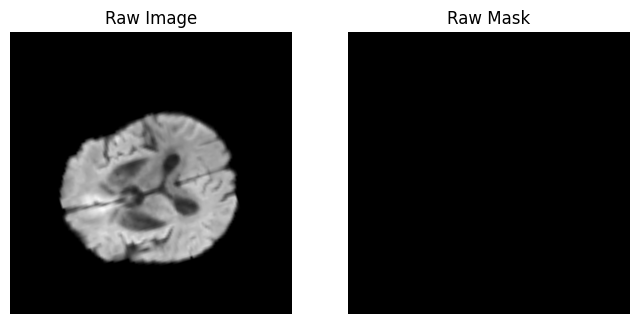

Sample 7 | Image shape: (512, 553, 70) | Mask shape: (512, 553, 70) | Mask values: tensor([0., 1.], dtype=torch.float64)


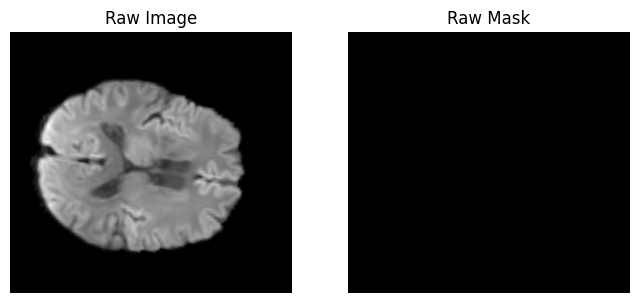


🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


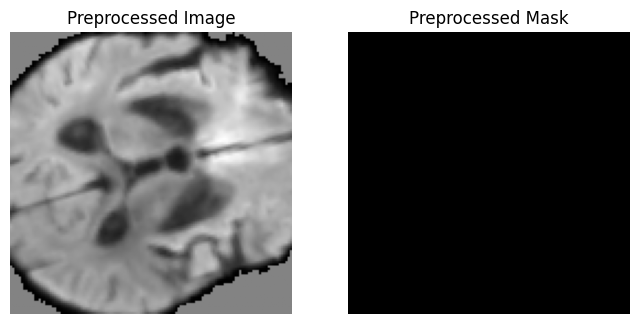

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


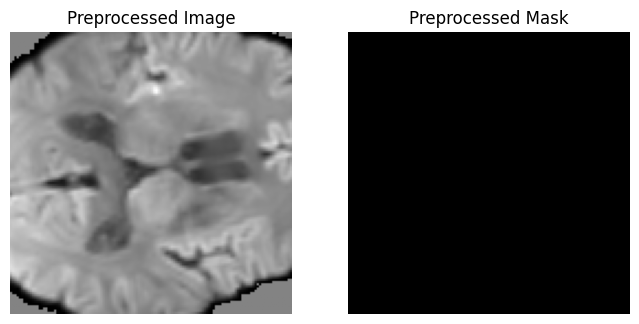


Client 0 dataset size: 50

Client 1
Original samples: 50 | Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 1 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


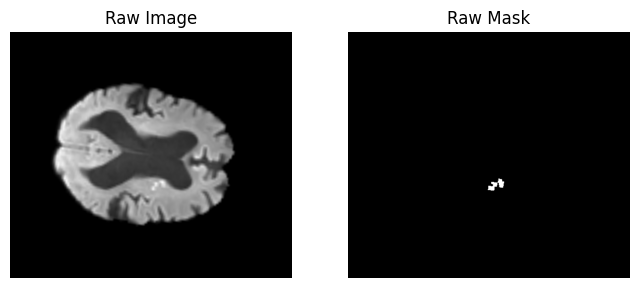

Sample 47 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


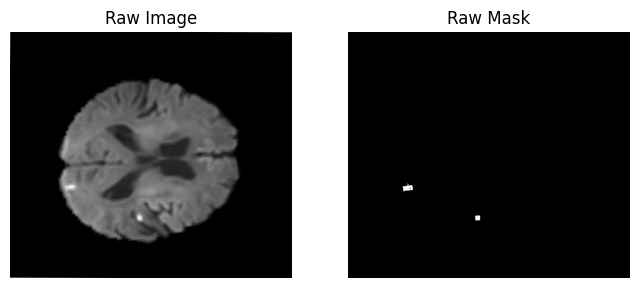


🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


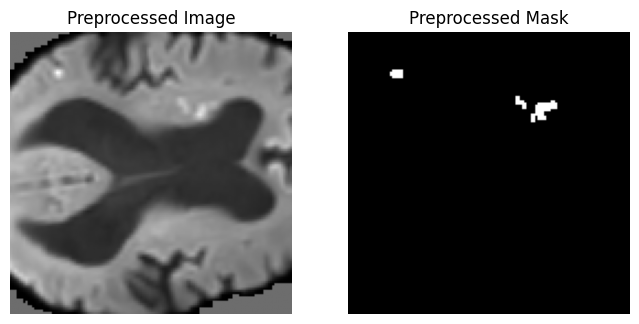

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


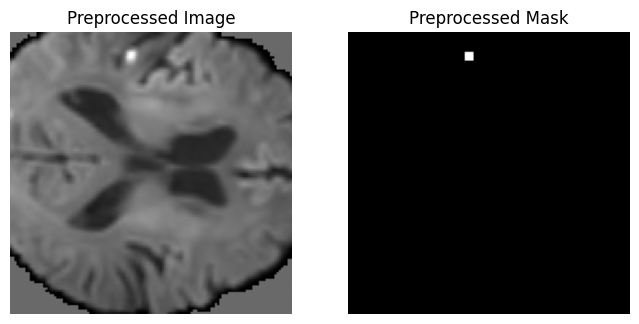


Client 1 dataset size: 50


In [ ]:

original_root = "D:/F25-156/ISLES24 Split"
processed_root = "D:/F25-156/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Original samples: {len(dwi_files)} | Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    print("\n🔵 RAW SAMPLES")
    for idx in sample_indices:

        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()

        print(
            f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
            f"Mask values: {torch.unique(torch.tensor(mask))}"
        )

        mid = img.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid], cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid], cmap="gray")
        plt.title("Raw Mask")
        plt.axis("off")
        plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [25]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


Swin UNETR

In [ ]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = SwinUNETR(
        in_channels=1,
        out_channels=1,
        feature_size=24,
        use_checkpoint=True
    ).to(device)

    print(model)
    return model

Using device: cuda


**Client Class**

In [27]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [28]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)
    
    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    new_params[key] += client_params_list[i][key]

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [29]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Linear(in_features=

**Federated Training loop**

In [30]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8246 | Dice: 0.1508 | IoU: 0.0815 | HD95: 80.8337


Client 0 | Epoch 2/20 | Loss: 0.7839 | Dice: 0.2479 | IoU: 0.1415 | HD95: 79.2698


Client 0 | Epoch 3/20 | Loss: 0.7677 | Dice: 0.2993 | IoU: 0.1760 | HD95: 77.8006


Client 0 | Epoch 4/20 | Loss: 0.7551 | Dice: 0.3475 | IoU: 0.2103 | HD95: 71.5134


Client 0 | Epoch 5/20 | Loss: 0.7408 | Dice: 0.4258 | IoU: 0.2705 | HD95: 66.2006


Client 0 | Epoch 6/20 | Loss: 0.7314 | Dice: 0.4244 | IoU: 0.2694 | HD95: 64.9832


Client 0 | Epoch 7/20 | Loss: 0.7197 | Dice: 0.4837 | IoU: 0.3190 | HD95: 53.6296


Client 0 | Epoch 8/20 | Loss: 0.7110 | Dice: 0.5088 | IoU: 0.3412 | HD95: 59.7895


Client 0 | Epoch 9/20 | Loss: 0.7064 | Dice: 0.4569 | IoU: 0.2961 | HD95: 56.1493


Client 0 | Epoch 10/20 | Loss: 0.6948 | Dice: 0.5246 | IoU: 0.3556 | HD95: 52.4033


Client 0 | Epoch 11/20 | Loss: 0.6876 | Dice: 0.5548 | IoU: 0.3839 | HD95: 44.1117


Client 0 | Epoch 12/20 | Loss: 0.6773 | Dice: 0.5550 | IoU: 0.3841 | HD95: 42.8181


Client 0 | Epoch 13/20 | Loss: 0.6678 | Dice: 0.6048 | IoU: 0.4335 | HD95: 40.4183


Client 0 | Epoch 14/20 | Loss: 0.6591 | Dice: 0.6117 | IoU: 0.4406 | HD95: 38.8036


Client 0 | Epoch 15/20 | Loss: 0.6525 | Dice: 0.6009 | IoU: 0.4295 | HD95: 34.2621


Client 0 | Epoch 16/20 | Loss: 0.6457 | Dice: 0.6101 | IoU: 0.4390 | HD95: 32.9812


Client 0 | Epoch 17/20 | Loss: 0.6369 | Dice: 0.6364 | IoU: 0.4667 | HD95: 28.4041


Client 0 | Epoch 18/20 | Loss: 0.6329 | Dice: 0.6072 | IoU: 0.4360 | HD95: 33.6582


Client 0 | Epoch 19/20 | Loss: 0.6236 | Dice: 0.6234 | IoU: 0.4528 | HD95: 30.5783


Clients Training:  50%|█████     | 1/2 [18:16<18:16, 1096.83s/it]

Client 0 | Epoch 20/20 | Loss: 0.6152 | Dice: 0.6546 | IoU: 0.4866 | HD95: 28.0966
Client 0 | Loss=0.6967 | Dice=0.6546 | IoU=0.4866 | HD95=28.0966


Client 1 | Epoch 1/20 | Loss: 0.8288 | Dice: 0.1212 | IoU: 0.0645 | HD95: 75.6003


Client 1 | Epoch 2/20 | Loss: 0.7934 | Dice: 0.2047 | IoU: 0.1140 | HD95: 76.2239


Client 1 | Epoch 3/20 | Loss: 0.7767 | Dice: 0.3036 | IoU: 0.1789 | HD95: 72.9935


Client 1 | Epoch 4/20 | Loss: 0.7633 | Dice: 0.3927 | IoU: 0.2443 | HD95: 63.3690


Client 1 | Epoch 5/20 | Loss: 0.7523 | Dice: 0.4080 | IoU: 0.2562 | HD95: 62.8126


Client 1 | Epoch 6/20 | Loss: 0.7404 | Dice: 0.4552 | IoU: 0.2946 | HD95: 49.4493


Client 1 | Epoch 7/20 | Loss: 0.7296 | Dice: 0.5001 | IoU: 0.3334 | HD95: 45.0494


Client 1 | Epoch 8/20 | Loss: 0.7208 | Dice: 0.5548 | IoU: 0.3839 | HD95: 37.6256


Client 1 | Epoch 9/20 | Loss: 0.7117 | Dice: 0.5621 | IoU: 0.3909 | HD95: 36.7979


Client 1 | Epoch 10/20 | Loss: 0.7032 | Dice: 0.5615 | IoU: 0.3904 | HD95: 36.6598


Client 1 | Epoch 11/20 | Loss: 0.6951 | Dice: 0.6027 | IoU: 0.4314 | HD95: 27.5092


Client 1 | Epoch 12/20 | Loss: 0.6877 | Dice: 0.5916 | IoU: 0.4200 | HD95: 30.4424


Client 1 | Epoch 13/20 | Loss: 0.6807 | Dice: 0.5907 | IoU: 0.4191 | HD95: 33.0804


Client 1 | Epoch 14/20 | Loss: 0.6727 | Dice: 0.6185 | IoU: 0.4477 | HD95: 28.2220


Client 1 | Epoch 15/20 | Loss: 0.6651 | Dice: 0.6474 | IoU: 0.4787 | HD95: 25.2754


Client 1 | Epoch 16/20 | Loss: 0.6586 | Dice: 0.6460 | IoU: 0.4771 | HD95: 19.5428


Client 1 | Epoch 17/20 | Loss: 0.6523 | Dice: 0.6498 | IoU: 0.4812 | HD95: 22.4999


Client 1 | Epoch 18/20 | Loss: 0.6467 | Dice: 0.6427 | IoU: 0.4735 | HD95: 24.2705


Client 1 | Epoch 19/20 | Loss: 0.6417 | Dice: 0.6117 | IoU: 0.4406 | HD95: 27.1093


Client 1 Epochs: 100%|██████████| 20/20 [17:53<00:00, 53.66s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.6353 | Dice: 0.6337 | IoU: 0.4638 | HD95: 25.3856
Client 1 | Loss=0.7078 | Dice=0.6337 | IoU=0.4638 | HD95=25.3856


Best global model updated with Dice=0.6249
Global | Val Loss=0.6213 | Dice=0.6249 | IoU=0.4544 | HD95=31.6749
Checkpoint saved for round 1 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6353 | Dice: 0.4797 | IoU: 0.3155 | HD95: 53.2978


Client 0 | Epoch 2/20 | Loss: 0.6171 | Dice: 0.5298 | IoU: 0.3604 | HD95: 41.4948


Client 0 | Epoch 3/20 | Loss: 0.5997 | Dice: 0.6196 | IoU: 0.4489 | HD95: 37.1625


Client 0 | Epoch 4/20 | Loss: 0.5912 | Dice: 0.6226 | IoU: 0.4520 | HD95: 30.8379


Client 0 | Epoch 5/20 | Loss: 0.5852 | Dice: 0.6244 | IoU: 0.4539 | HD95: 35.3880


Client 0 | Epoch 6/20 | Loss: 0.5789 | Dice: 0.6321 | IoU: 0.4621 | HD95: 33.2483


Client 0 | Epoch 7/20 | Loss: 0.5688 | Dice: 0.6535 | IoU: 0.4854 | HD95: 30.0368


Client 0 | Epoch 8/20 | Loss: 0.5614 | Dice: 0.6629 | IoU: 0.4957 | HD95: 23.8134


Client 0 | Epoch 9/20 | Loss: 0.5537 | Dice: 0.6743 | IoU: 0.5087 | HD95: 21.8665


Client 0 | Epoch 10/20 | Loss: 0.5472 | Dice: 0.6819 | IoU: 0.5173 | HD95: 21.4756


Client 0 | Epoch 11/20 | Loss: 0.5397 | Dice: 0.7013 | IoU: 0.5400 | HD95: 18.2202


Client 0 | Epoch 12/20 | Loss: 0.5315 | Dice: 0.7179 | IoU: 0.5600 | HD95: 18.9647


Client 0 | Epoch 13/20 | Loss: 0.5251 | Dice: 0.7182 | IoU: 0.5603 | HD95: 20.3737


Client 0 | Epoch 14/20 | Loss: 0.5190 | Dice: 0.7172 | IoU: 0.5591 | HD95: 18.2739


Client 0 | Epoch 15/20 | Loss: 0.5127 | Dice: 0.7195 | IoU: 0.5619 | HD95: 16.0271


Client 0 | Epoch 16/20 | Loss: 0.5068 | Dice: 0.7142 | IoU: 0.5555 | HD95: 20.4369


Client 0 | Epoch 17/20 | Loss: 0.5079 | Dice: 0.6794 | IoU: 0.5144 | HD95: 29.0894


Client 0 | Epoch 18/20 | Loss: 0.5074 | Dice: 0.6403 | IoU: 0.4709 | HD95: 35.4016


Client 0 | Epoch 19/20 | Loss: 0.5024 | Dice: 0.6372 | IoU: 0.4675 | HD95: 33.4138


Clients Training:  50%|█████     | 1/2 [16:52<16:52, 1012.53s/it]

Client 0 | Epoch 20/20 | Loss: 0.5020 | Dice: 0.6194 | IoU: 0.4487 | HD95: 31.0198
Client 0 | Loss=0.5497 | Dice=0.6194 | IoU=0.4487 | HD95=31.0198


Client 1 | Epoch 1/20 | Loss: 0.6462 | Dice: 0.5892 | IoU: 0.4176 | HD95: 35.4641


Client 1 | Epoch 2/20 | Loss: 0.6448 | Dice: 0.4700 | IoU: 0.3072 | HD95: 50.7125


Client 1 | Epoch 3/20 | Loss: 0.6282 | Dice: 0.5640 | IoU: 0.3927 | HD95: 33.9170


Client 1 | Epoch 4/20 | Loss: 0.6187 | Dice: 0.6318 | IoU: 0.4617 | HD95: 26.8794


Client 1 | Epoch 5/20 | Loss: 0.6112 | Dice: 0.6459 | IoU: 0.4770 | HD95: 22.9954


Client 1 | Epoch 6/20 | Loss: 0.6033 | Dice: 0.6638 | IoU: 0.4968 | HD95: 19.8176


Client 1 | Epoch 7/20 | Loss: 0.5966 | Dice: 0.6719 | IoU: 0.5059 | HD95: 16.9350


Client 1 | Epoch 8/20 | Loss: 0.5896 | Dice: 0.6811 | IoU: 0.5165 | HD95: 14.2378


Client 1 | Epoch 9/20 | Loss: 0.5826 | Dice: 0.6872 | IoU: 0.5234 | HD95: 13.4148


Client 1 | Epoch 10/20 | Loss: 0.5767 | Dice: 0.6892 | IoU: 0.5258 | HD95: 17.8278


Client 1 | Epoch 11/20 | Loss: 0.5701 | Dice: 0.6937 | IoU: 0.5310 | HD95: 15.4453


Client 1 | Epoch 12/20 | Loss: 0.5621 | Dice: 0.7121 | IoU: 0.5529 | HD95: 12.4397


Client 1 | Epoch 13/20 | Loss: 0.5560 | Dice: 0.7037 | IoU: 0.5428 | HD95: 10.7549


Client 1 | Epoch 14/20 | Loss: 0.5488 | Dice: 0.7171 | IoU: 0.5589 | HD95: 10.2784


Client 1 | Epoch 15/20 | Loss: 0.5433 | Dice: 0.7051 | IoU: 0.5446 | HD95: 13.1794


Client 1 | Epoch 16/20 | Loss: 0.5365 | Dice: 0.7019 | IoU: 0.5407 | HD95: 16.9057


Client 1 | Epoch 17/20 | Loss: 0.5273 | Dice: 0.7236 | IoU: 0.5669 | HD95: 9.4502


Client 1 | Epoch 18/20 | Loss: 0.5216 | Dice: 0.7179 | IoU: 0.5600 | HD95: 11.0118


Client 1 | Epoch 19/20 | Loss: 0.5141 | Dice: 0.7279 | IoU: 0.5722 | HD95: 10.0611


Client 1 Epochs: 100%|██████████| 20/20 [16:52<00:00, 50.63s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.5052 | Dice: 0.7396 | IoU: 0.5869 | HD95: 10.5796
Client 1 | Loss=0.5741 | Dice=0.7396 | IoU=0.5869 | HD95=10.5796


Best global model updated with Dice=0.6624
Global | Val Loss=0.4801 | Dice=0.6624 | IoU=0.4953 | HD95=22.2904
Checkpoint saved for round 2 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4814 | Dice: 0.6832 | IoU: 0.5189 | HD95: 25.1689


Client 0 | Epoch 2/20 | Loss: 0.4699 | Dice: 0.7200 | IoU: 0.5625 | HD95: 16.2297


Client 0 | Epoch 3/20 | Loss: 0.4631 | Dice: 0.7151 | IoU: 0.5565 | HD95: 18.8341


Client 0 | Epoch 4/20 | Loss: 0.4543 | Dice: 0.7239 | IoU: 0.5673 | HD95: 20.0443


Client 0 | Epoch 5/20 | Loss: 0.4473 | Dice: 0.7549 | IoU: 0.6064 | HD95: 13.0150


Client 0 | Epoch 6/20 | Loss: 0.4403 | Dice: 0.7558 | IoU: 0.6074 | HD95: 12.2056


Client 0 | Epoch 7/20 | Loss: 0.4330 | Dice: 0.7563 | IoU: 0.6081 | HD95: 10.3313


Client 0 | Epoch 8/20 | Loss: 0.4256 | Dice: 0.7650 | IoU: 0.6194 | HD95: 7.4556


Client 0 | Epoch 9/20 | Loss: 0.4188 | Dice: 0.7637 | IoU: 0.6178 | HD95: 9.1005


Client 0 | Epoch 10/20 | Loss: 0.4116 | Dice: 0.7772 | IoU: 0.6355 | HD95: 7.7404


Client 0 | Epoch 11/20 | Loss: 0.4059 | Dice: 0.7796 | IoU: 0.6388 | HD95: 6.2625


Client 0 | Epoch 12/20 | Loss: 0.4021 | Dice: 0.7633 | IoU: 0.6172 | HD95: 9.7222


Client 0 | Epoch 13/20 | Loss: 0.3995 | Dice: 0.7525 | IoU: 0.6032 | HD95: 17.4083


Client 0 | Epoch 14/20 | Loss: 0.4018 | Dice: 0.7209 | IoU: 0.5636 | HD95: 17.9718


Client 0 | Epoch 15/20 | Loss: 0.4279 | Dice: 0.6347 | IoU: 0.4649 | HD95: 30.6065


Client 0 | Epoch 16/20 | Loss: 0.3946 | Dice: 0.7245 | IoU: 0.5680 | HD95: 17.0733


Client 0 | Epoch 17/20 | Loss: 0.3754 | Dice: 0.7671 | IoU: 0.6222 | HD95: 11.6699


Client 0 | Epoch 18/20 | Loss: 0.3647 | Dice: 0.7799 | IoU: 0.6393 | HD95: 7.9212


Client 0 | Epoch 19/20 | Loss: 0.3582 | Dice: 0.7790 | IoU: 0.6380 | HD95: 11.6935


Clients Training:  50%|█████     | 1/2 [16:33<16:33, 993.35s/it]

Client 0 | Epoch 20/20 | Loss: 0.3488 | Dice: 0.7951 | IoU: 0.6599 | HD95: 7.3039
Client 0 | Loss=0.4162 | Dice=0.7951 | IoU=0.6599 | HD95=7.3039


Client 1 | Epoch 1/20 | Loss: 0.5122 | Dice: 0.6694 | IoU: 0.5030 | HD95: 19.9432


Client 1 | Epoch 2/20 | Loss: 0.5018 | Dice: 0.7002 | IoU: 0.5386 | HD95: 19.2082


Client 1 | Epoch 3/20 | Loss: 0.4930 | Dice: 0.7175 | IoU: 0.5594 | HD95: 14.6787


Client 1 | Epoch 4/20 | Loss: 0.4840 | Dice: 0.7293 | IoU: 0.5739 | HD95: 12.1304


Client 1 | Epoch 5/20 | Loss: 0.4737 | Dice: 0.7376 | IoU: 0.5843 | HD95: 8.6875


Client 1 | Epoch 6/20 | Loss: 0.4645 | Dice: 0.7495 | IoU: 0.5994 | HD95: 7.9714


Client 1 | Epoch 7/20 | Loss: 0.4562 | Dice: 0.7585 | IoU: 0.6109 | HD95: 7.3238


Client 1 | Epoch 8/20 | Loss: 0.4477 | Dice: 0.7627 | IoU: 0.6164 | HD95: 7.3062


Client 1 | Epoch 9/20 | Loss: 0.4401 | Dice: 0.7666 | IoU: 0.6216 | HD95: 4.6222


Client 1 | Epoch 10/20 | Loss: 0.4328 | Dice: 0.7662 | IoU: 0.6210 | HD95: 4.3117


Client 1 | Epoch 11/20 | Loss: 0.4254 | Dice: 0.7757 | IoU: 0.6336 | HD95: 6.3270


Client 1 | Epoch 12/20 | Loss: 0.4179 | Dice: 0.7760 | IoU: 0.6340 | HD95: 4.4613


Client 1 | Epoch 13/20 | Loss: 0.4122 | Dice: 0.7561 | IoU: 0.6079 | HD95: 8.9618


Client 1 | Epoch 14/20 | Loss: 0.4039 | Dice: 0.7755 | IoU: 0.6334 | HD95: 4.7456


Client 1 | Epoch 15/20 | Loss: 0.3916 | Dice: 0.7888 | IoU: 0.6513 | HD95: 4.1820


Client 1 | Epoch 16/20 | Loss: 0.3830 | Dice: 0.7808 | IoU: 0.6404 | HD95: 4.6882


Client 1 | Epoch 17/20 | Loss: 0.3777 | Dice: 0.7828 | IoU: 0.6431 | HD95: 8.2513


Client 1 | Epoch 18/20 | Loss: 0.3689 | Dice: 0.7830 | IoU: 0.6434 | HD95: 5.4167


Client 1 | Epoch 19/20 | Loss: 0.3609 | Dice: 0.7921 | IoU: 0.6557 | HD95: 4.1737


Client 1 Epochs: 100%|██████████| 20/20 [17:26<00:00, 52.33s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.3514 | Dice: 0.8050 | IoU: 0.6737 | HD95: 4.5175
Client 1 | Loss=0.4299 | Dice=0.8050 | IoU=0.6737 | HD95=4.5175


Best global model updated with Dice=0.6912
Global | Val Loss=0.3736 | Dice=0.6912 | IoU=0.5281 | HD95=14.7168
Checkpoint saved for round 3 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3404 | Dice: 0.7893 | IoU: 0.6519 | HD95: 11.3634


Client 0 | Epoch 2/20 | Loss: 0.3328 | Dice: 0.7866 | IoU: 0.6482 | HD95: 12.2110


Client 0 | Epoch 3/20 | Loss: 0.3279 | Dice: 0.7864 | IoU: 0.6480 | HD95: 8.6554


Client 0 | Epoch 4/20 | Loss: 0.3212 | Dice: 0.7881 | IoU: 0.6503 | HD95: 10.0310


Client 0 | Epoch 5/20 | Loss: 0.3153 | Dice: 0.8016 | IoU: 0.6689 | HD95: 9.0394


Client 0 | Epoch 6/20 | Loss: 0.3066 | Dice: 0.8064 | IoU: 0.6756 | HD95: 6.6911


Client 0 | Epoch 7/20 | Loss: 0.3009 | Dice: 0.8109 | IoU: 0.6819 | HD95: 6.9830


Client 0 | Epoch 8/20 | Loss: 0.2961 | Dice: 0.8098 | IoU: 0.6804 | HD95: 7.9147


Client 0 | Epoch 9/20 | Loss: 0.2919 | Dice: 0.8108 | IoU: 0.6817 | HD95: 5.0179


Client 0 | Epoch 10/20 | Loss: 0.2886 | Dice: 0.8172 | IoU: 0.6909 | HD95: 4.0410


Client 0 | Epoch 11/20 | Loss: 0.2816 | Dice: 0.8092 | IoU: 0.6795 | HD95: 8.2988


Client 0 | Epoch 12/20 | Loss: 0.2798 | Dice: 0.8004 | IoU: 0.6672 | HD95: 7.2057


Client 0 | Epoch 13/20 | Loss: 0.2679 | Dice: 0.8175 | IoU: 0.6913 | HD95: 4.8477


Client 0 | Epoch 14/20 | Loss: 0.2606 | Dice: 0.8268 | IoU: 0.7047 | HD95: 3.9816


Client 0 | Epoch 15/20 | Loss: 0.2556 | Dice: 0.8314 | IoU: 0.7115 | HD95: 5.3258


Client 0 | Epoch 16/20 | Loss: 0.2518 | Dice: 0.8300 | IoU: 0.7094 | HD95: 4.9035


Client 0 | Epoch 17/20 | Loss: 0.2461 | Dice: 0.8343 | IoU: 0.7158 | HD95: 4.9186


Client 0 | Epoch 18/20 | Loss: 0.2415 | Dice: 0.8383 | IoU: 0.7216 | HD95: 4.8905


Client 0 | Epoch 19/20 | Loss: 0.2361 | Dice: 0.8397 | IoU: 0.7238 | HD95: 3.9631


Clients Training:  50%|█████     | 1/2 [16:50<16:50, 1010.98s/it]

Client 0 | Epoch 20/20 | Loss: 0.2321 | Dice: 0.8424 | IoU: 0.7277 | HD95: 3.8428
Client 0 | Loss=0.2837 | Dice=0.8424 | IoU=0.7277 | HD95=3.8428


Client 1 | Epoch 1/20 | Loss: 0.3578 | Dice: 0.7882 | IoU: 0.6505 | HD95: 6.6454


Client 1 | Epoch 2/20 | Loss: 0.3613 | Dice: 0.7564 | IoU: 0.6083 | HD95: 12.0767


Client 1 | Epoch 3/20 | Loss: 0.3662 | Dice: 0.7284 | IoU: 0.5728 | HD95: 18.8551


Client 1 | Epoch 4/20 | Loss: 0.3446 | Dice: 0.7745 | IoU: 0.6320 | HD95: 11.4559


Client 1 | Epoch 5/20 | Loss: 0.3319 | Dice: 0.7891 | IoU: 0.6517 | HD95: 6.9296


Client 1 | Epoch 6/20 | Loss: 0.3220 | Dice: 0.8019 | IoU: 0.6694 | HD95: 3.0779


Client 1 | Epoch 7/20 | Loss: 0.3131 | Dice: 0.8158 | IoU: 0.6888 | HD95: 5.2341


Client 1 | Epoch 8/20 | Loss: 0.3051 | Dice: 0.8194 | IoU: 0.6941 | HD95: 2.8545


Client 1 | Epoch 9/20 | Loss: 0.2968 | Dice: 0.8262 | IoU: 0.7039 | HD95: 2.7767


Client 1 | Epoch 10/20 | Loss: 0.2888 | Dice: 0.8253 | IoU: 0.7025 | HD95: 2.7013


Client 1 | Epoch 11/20 | Loss: 0.2837 | Dice: 0.8300 | IoU: 0.7094 | HD95: 2.7804


Client 1 | Epoch 12/20 | Loss: 0.2843 | Dice: 0.8161 | IoU: 0.6893 | HD95: 2.8351


Client 1 | Epoch 13/20 | Loss: 0.2796 | Dice: 0.8137 | IoU: 0.6859 | HD95: 5.0138


Client 1 | Epoch 14/20 | Loss: 0.2726 | Dice: 0.8194 | IoU: 0.6940 | HD95: 2.9253


Client 1 | Epoch 15/20 | Loss: 0.2623 | Dice: 0.8306 | IoU: 0.7103 | HD95: 2.8660


Client 1 | Epoch 16/20 | Loss: 0.2551 | Dice: 0.8383 | IoU: 0.7217 | HD95: 2.6182


Client 1 | Epoch 17/20 | Loss: 0.2503 | Dice: 0.8344 | IoU: 0.7159 | HD95: 2.6198


Client 1 | Epoch 18/20 | Loss: 0.2448 | Dice: 0.8391 | IoU: 0.7227 | HD95: 2.5787


Client 1 | Epoch 19/20 | Loss: 0.2399 | Dice: 0.8471 | IoU: 0.7347 | HD95: 2.4835


Client 1 Epochs: 100%|██████████| 20/20 [16:47<00:00, 50.39s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.2386 | Dice: 0.8429 | IoU: 0.7284 | HD95: 4.8634
Client 1 | Loss=0.2949 | Dice=0.8429 | IoU=0.7284 | HD95=4.8634


Global | Val Loss=0.3006 | Dice=0.6844 | IoU=0.5202 | HD95=16.5129
Checkpoint saved for round 4 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round4.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2610 | Dice: 0.7762 | IoU: 0.6343 | HD95: 15.7599


Client 0 | Epoch 2/20 | Loss: 0.3014 | Dice: 0.7072 | IoU: 0.5471 | HD95: 30.8277


Client 0 | Epoch 3/20 | Loss: 0.2648 | Dice: 0.7620 | IoU: 0.6155 | HD95: 22.3768


Client 0 | Epoch 4/20 | Loss: 0.2412 | Dice: 0.8004 | IoU: 0.6672 | HD95: 13.2564


Client 0 | Epoch 5/20 | Loss: 0.2263 | Dice: 0.8217 | IoU: 0.6974 | HD95: 4.0234


Client 0 | Epoch 6/20 | Loss: 0.2190 | Dice: 0.8288 | IoU: 0.7076 | HD95: 5.3848


Client 0 | Epoch 7/20 | Loss: 0.2120 | Dice: 0.8401 | IoU: 0.7243 | HD95: 4.7739


Client 0 | Epoch 8/20 | Loss: 0.2071 | Dice: 0.8437 | IoU: 0.7296 | HD95: 4.8409


Client 0 | Epoch 9/20 | Loss: 0.2031 | Dice: 0.8494 | IoU: 0.7382 | HD95: 4.7304


Client 0 | Epoch 10/20 | Loss: 0.1992 | Dice: 0.8525 | IoU: 0.7430 | HD95: 4.7003


Client 0 | Epoch 11/20 | Loss: 0.1953 | Dice: 0.8537 | IoU: 0.7448 | HD95: 4.7128


Client 0 | Epoch 12/20 | Loss: 0.1936 | Dice: 0.8489 | IoU: 0.7374 | HD95: 4.7549


Client 0 | Epoch 13/20 | Loss: 0.1895 | Dice: 0.8533 | IoU: 0.7442 | HD95: 7.0212


Client 0 | Epoch 14/20 | Loss: 0.1862 | Dice: 0.8626 | IoU: 0.7584 | HD95: 4.8418


Client 0 | Epoch 15/20 | Loss: 0.1850 | Dice: 0.8518 | IoU: 0.7419 | HD95: 3.8681


Client 0 | Epoch 16/20 | Loss: 0.1823 | Dice: 0.8596 | IoU: 0.7538 | HD95: 6.1014


Client 0 | Epoch 17/20 | Loss: 0.1784 | Dice: 0.8569 | IoU: 0.7497 | HD95: 4.7083


Client 0 | Epoch 18/20 | Loss: 0.1744 | Dice: 0.8625 | IoU: 0.7582 | HD95: 4.5866


Client 0 | Epoch 19/20 | Loss: 0.1733 | Dice: 0.8609 | IoU: 0.7558 | HD95: 3.8830


Clients Training:  50%|█████     | 1/2 [16:37<16:37, 997.99s/it]

Client 0 | Epoch 20/20 | Loss: 0.1735 | Dice: 0.8594 | IoU: 0.7535 | HD95: 3.5134
Client 0 | Loss=0.2083 | Dice=0.8594 | IoU=0.7535 | HD95=3.5134


Client 1 | Epoch 1/20 | Loss: 0.2399 | Dice: 0.8312 | IoU: 0.7112 | HD95: 4.9733


Client 1 | Epoch 2/20 | Loss: 0.2414 | Dice: 0.8242 | IoU: 0.7010 | HD95: 2.6634


Client 1 | Epoch 3/20 | Loss: 0.2323 | Dice: 0.8287 | IoU: 0.7075 | HD95: 2.6004


Client 1 | Epoch 4/20 | Loss: 0.2219 | Dice: 0.8444 | IoU: 0.7307 | HD95: 2.6642


Client 1 | Epoch 5/20 | Loss: 0.2161 | Dice: 0.8522 | IoU: 0.7425 | HD95: 2.5995


Client 1 | Epoch 6/20 | Loss: 0.2117 | Dice: 0.8532 | IoU: 0.7440 | HD95: 2.4681


Client 1 | Epoch 7/20 | Loss: 0.2115 | Dice: 0.8465 | IoU: 0.7338 | HD95: 2.5707


Client 1 | Epoch 8/20 | Loss: 0.2098 | Dice: 0.8443 | IoU: 0.7306 | HD95: 3.9235


Client 1 | Epoch 9/20 | Loss: 0.2045 | Dice: 0.8505 | IoU: 0.7400 | HD95: 2.4246


Client 1 | Epoch 10/20 | Loss: 0.1993 | Dice: 0.8557 | IoU: 0.7477 | HD95: 2.4598


Client 1 | Epoch 11/20 | Loss: 0.1951 | Dice: 0.8602 | IoU: 0.7546 | HD95: 2.4369


Client 1 | Epoch 12/20 | Loss: 0.1899 | Dice: 0.8638 | IoU: 0.7602 | HD95: 2.4238


Client 1 | Epoch 13/20 | Loss: 0.1874 | Dice: 0.8686 | IoU: 0.7677 | HD95: 2.3552


Client 1 | Epoch 14/20 | Loss: 0.1855 | Dice: 0.8654 | IoU: 0.7627 | HD95: 2.3067


Client 1 | Epoch 15/20 | Loss: 0.1802 | Dice: 0.8704 | IoU: 0.7705 | HD95: 2.3286


Client 1 | Epoch 16/20 | Loss: 0.1780 | Dice: 0.8709 | IoU: 0.7713 | HD95: 2.2831


Client 1 | Epoch 17/20 | Loss: 0.1830 | Dice: 0.8566 | IoU: 0.7491 | HD95: 4.5541


Client 1 | Epoch 18/20 | Loss: 0.1807 | Dice: 0.8618 | IoU: 0.7571 | HD95: 2.4065


Client 1 | Epoch 19/20 | Loss: 0.1723 | Dice: 0.8716 | IoU: 0.7724 | HD95: 2.3177


Client 1 Epochs: 100%|██████████| 20/20 [16:44<00:00, 50.20s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1670 | Dice: 0.8757 | IoU: 0.7788 | HD95: 2.2950
Client 1 | Loss=0.2004 | Dice=0.8757 | IoU=0.7788 | HD95=2.2950


Global | Val Loss=0.2782 | Dice=0.6633 | IoU=0.4963 | HD95=17.2300
Checkpoint saved for round 5 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round5.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 5 (no Dice improvement for 2 rounds)


**Graph**

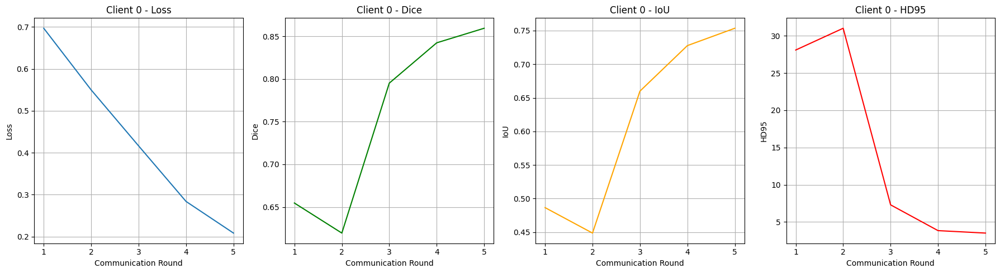

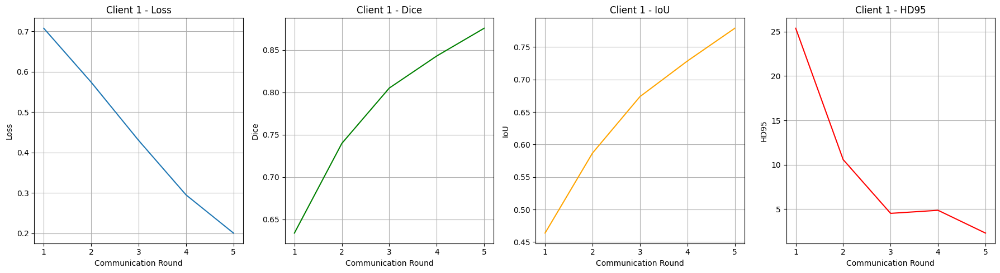

In [31]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

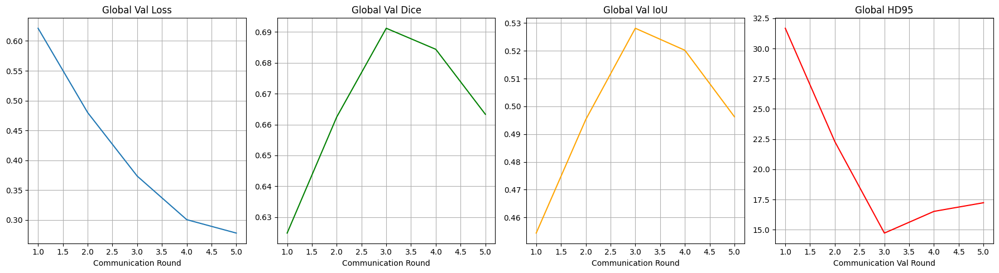

In [32]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [33]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_12904\837846673.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth

Test samples: 29
SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Li

Testing: 100%|██████████| 29/29 [00:14<00:00,  1.96it/s, Dice=0.6439, IoU=0.4748, HD95=25.6699]


Test Set Metrics:
Dice: 0.6439
IoU: 0.4748
HD95: 25.6699


**Visualize**

29


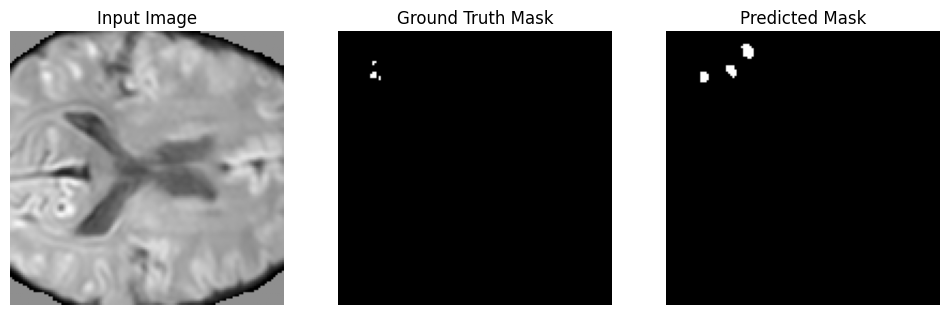

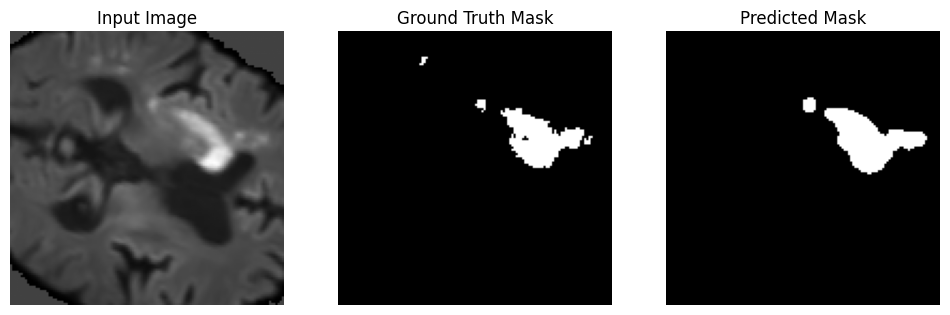

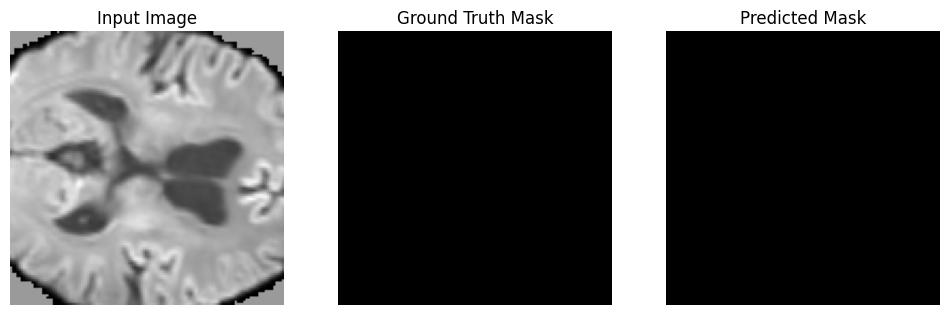

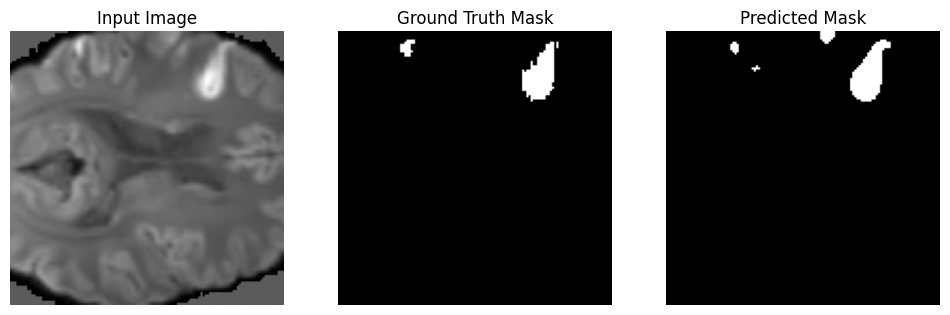

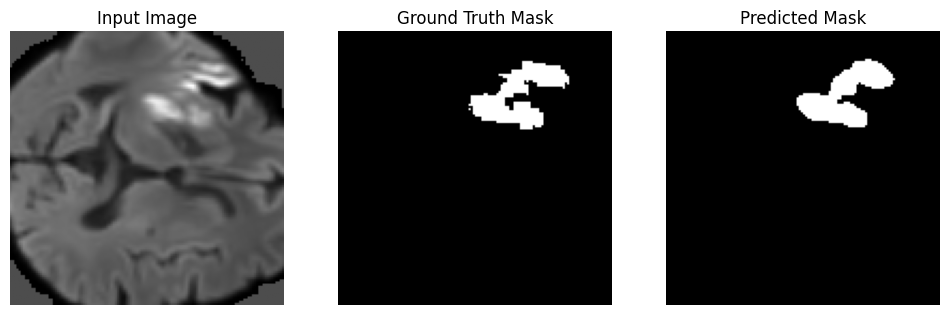

...

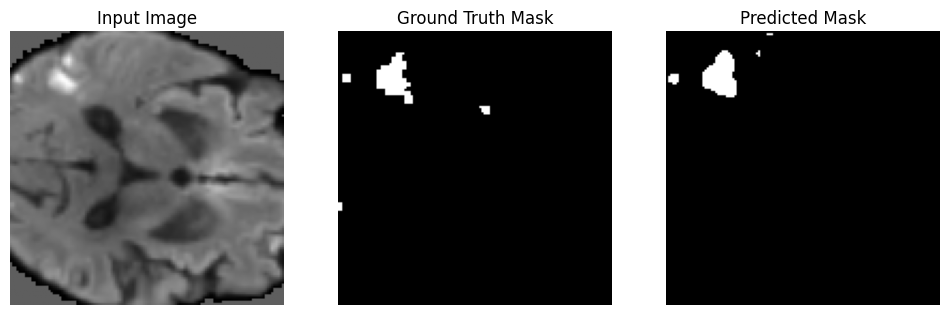

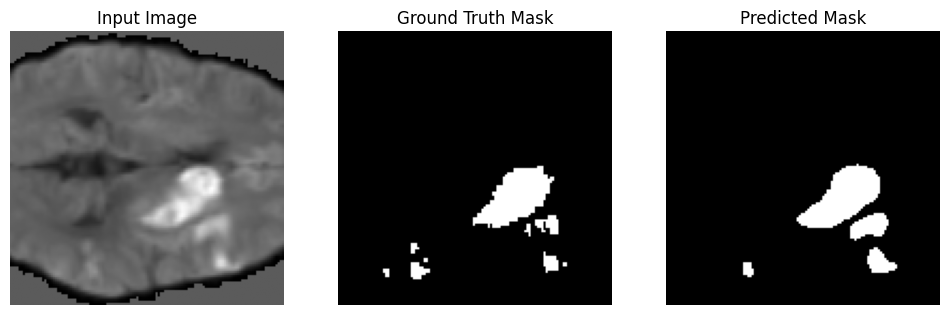

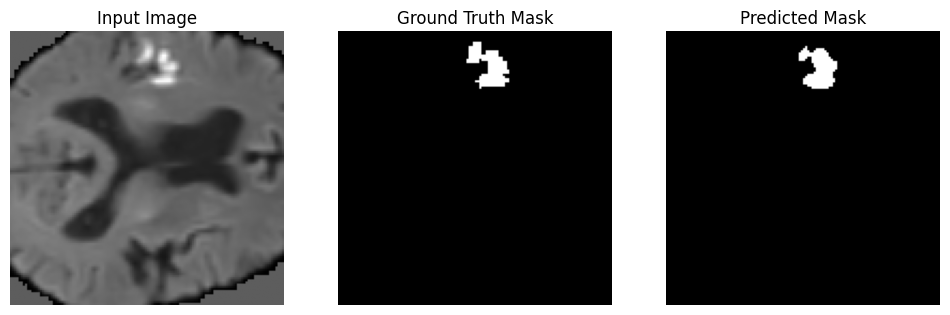

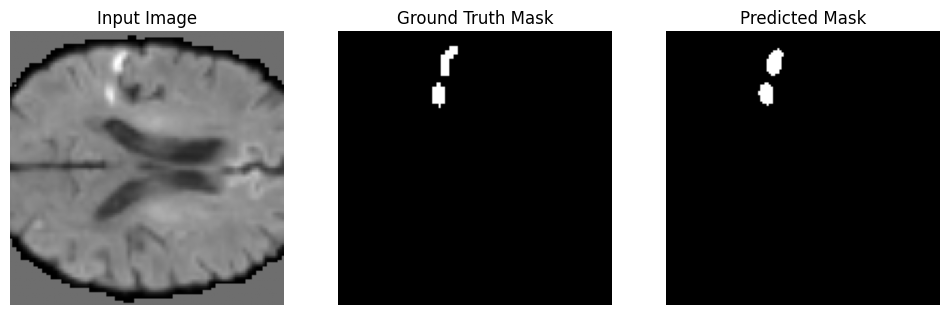

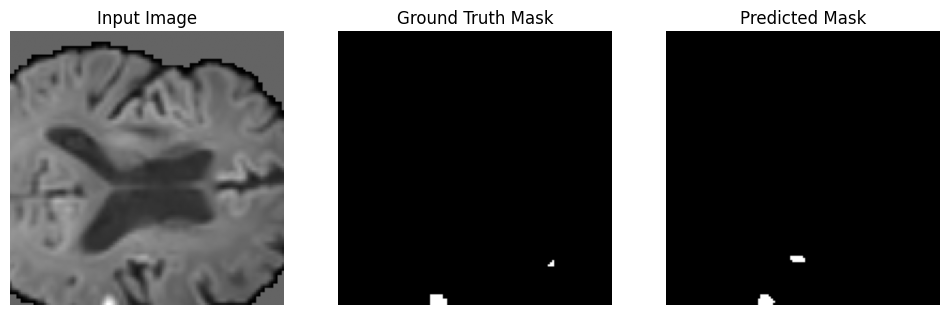

In [34]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()